In [1]:
suppressWarnings(suppressPackageStartupMessages({
    library(Seurat)
    library(Signac)
    library(EnsDb.Hsapiens.v86)
    library(dplyr)
    library(ggplot2)
    library(bedr)
    library(SeuratDisk)
    library(scales)
    library(reshape2)
    library(Hmisc)
    library(tidyr)
    library(tidyverse)
    library(crayon)
    library(readr)
    library(future)
    library(combinat)
    library("TxDb.Hsapiens.UCSC.hg38.knownGene")
    library(GenomicRanges)
    library(GenomicFeatures)
    library(rsnps)
    library(biomaRt)
    library(ggpubr)
    library(gridExtra)
    library(patchwork)
}))
options(timeout=100)
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')

# Definitions etc

In [2]:
set.seed(1234)
options(digits=2)
stats <- c()

In [3]:
options(future.globals.maxSize= 250 * 1024^3) # 650Gb
# plan()

# Enable parallelization
plan(sequential)
plan("multicore", workers = 64)

In [4]:
if(!exists("papermill_run")) {
    prj_name = "Screen1_66guides"
    data_subdir_suffixes = "L1,L2,L3,L4"     
    secondary_a_path = "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/"
    save_seurat_h5 = "YES"
}

In [5]:
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))

### Load Seurat file

In [11]:
integrated_h5_path <- "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/integrated/seurat_objects/integrated.h5seurat"
seurat_combined    <- LoadH5Seurat(integrated_h5_path, verbose = F)
#seurat_combined    <- subset(seurat_combined, subset=status=='singlet')

Validating h5Seurat file

Warning message:
"Adding a command log without an assay associated with it"


Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [12]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

### Load THRESHOLDS.tsv

In [13]:
thr_f_name = paste0(secondary_a_path, "/integrated/THRESHOLDS.tsv")
df_thresholds = read.table(thr_f_name, header=T, strip.white = T)
df_thresholds <- df_thresholds %>% pivot_wider(names_from = batch, values_from = threshold)
df_thresholds <- as.data.frame(df_thresholds)

### Load guide df

In [14]:
df_guide = read.table("/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/66CRISPRi_ref_for_diffex.txt", sep = "\t", header = T, strip.white = T)
head(df_guide)

,gene,guide1,guide2,alias,subclass,class
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CD13,CD13-1a,CD13-1b,ANPEP,tss,targeting
2,CD55,CD55-1a,CD55-1b,CD55,tss,targeting
3,CD73,CD73-1a,CD73-1b,NT5E,tss,targeting
4,FUBP1,FUBP1-1a,FUBP1-1b,FUBP1,tss,targeting
5,C15orf40,C15orf40-1a,C15orf40-1b,C15orf40,tss,targeting
6,MAFF,MAFF-1a,MAFF-1b,MAFF,tss,targeting


## FeaturePlot singlet & doublet

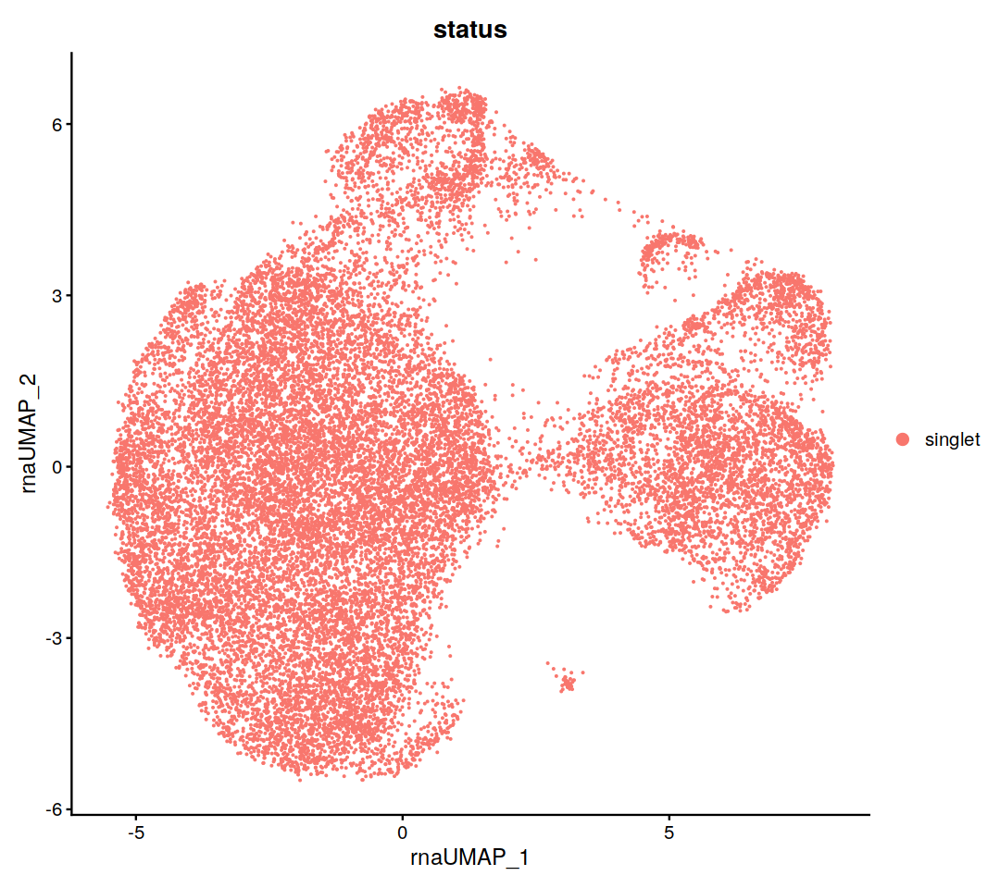

In [15]:
options(repr.plot.width=9, repr.plot.height=8)
DimPlot(seurat_combined, group.by='status')

# Differential expression

## Select perturbed/control cells
Find guide+ (perturbed) and guide- (unperturbed) cells for each guide

In [16]:
libraries = unique(seurat_combined$library)
seurat_libs = list()
for(i in seq_along(libraries)){ 
    lib = libraries[i]
    seurat_libs[[i]] = subset(seurat_combined, subset = library == lib)
}
names(seurat_libs) <- libraries

In [17]:
perturbed_cells_by_guide = list()

for(i in 1:nrow(df_thresholds)){  
    perturbed_cells_in_all_libs = list()
    guide = df_thresholds$guide[i]
    # Loop over libraries
    for(lib in libraries){        
        seurat_lib = seurat_libs[[lib]]
        threshold = df_thresholds[i, lib]        
        #cat(blue(guide, lib, threshold, "\n"))
        cells_in_lib = Cells(seurat_lib)        
        sgrna_counts = seurat_lib[['sgRNA']]@counts
        select_perturbed = sgrna_counts[guide, cells_in_lib] >= threshold
        perturbed_cells_in_library = cells_in_lib[select_perturbed]
        #cat(length(cells_in_lib), "in", lib, guide, length(perturbed_cells_in_library), "cells >", threshold, "\n")        
        if(!is.na(threshold)) {
            perturbed_cells_in_all_libs = append(perturbed_cells_in_all_libs, perturbed_cells_in_library)
        }
    }
    perturbed_cells_by_guide[[i]] = perturbed_cells_in_all_libs
}
names(perturbed_cells_by_guide) <- df_thresholds$guide

In [18]:
length(perturbed_cells_by_guide[[3]])

[1] 948

In [19]:
df_thresholds$guide[grepl("NT" , df_thresholds$guide)]

[1] "NTCE1-1a" "NTCE3-1a" "NTCE3-1b" "NTCE4-1a" "NTCE4-1b"

## Helper functions (Just source helper_functions_for_diffex.r instead)

Mark cells that are positive for given guides as guide_positive, all others as guide_negative

In [20]:
mark_guide_pos_neg <- function(seurat_obj, perturbed_cells_by_guide, guides, print_counts = T) {
    all_cells = Cells(seurat_obj)
    perturbed_cells = c()
    dummy_perturbed = c()
    
    for(guide in guides) {
        dummy_perturbed = unlist(perturbed_cells_by_guide[[guide]])
        perturbed_cells = union(perturbed_cells, dummy_perturbed)    
        #cat(guide," ", length(perturbed_cells), "\n")
    }

    unperturbed_cells = unlist(setdiff(all_cells, perturbed_cells))
    Idents(seurat_obj) <- "guide_negative"
    seurat_obj <- SetIdent(seurat_obj, cells = perturbed_cells, value = "guide_positive") 

    if(print_counts) {
        n_gplus   = length(perturbed_cells)
        n_gminus = length(unperturbed_cells)    
        cat(blue("Guide+ =",n_gplus, "; Guide- =", n_gminus, "\n"))
    }
    
    seurat_obj
}

Mark cells that are positive for given guides as 'guide_positive', unperturbed as 'unperturbed', all others as 'guide_negative'. The 'unperturbed' are the cells with either no guides at all or only positive for non-targeting guides. I wanted use them as a gold-standard set of controls, but their number is pretty low. 

In [21]:
mark_pert_unpert <- function(seurat_obj, perturbed_cells_by_guide, df_guides, guides, print_counts = F) {
    guide_classes = unique(filter(df_guide, guide1 %in% guides | guide2 %in% guides)$class)
    if('nt_ctrl' %in% guide_classes) {
        stop("You can't pass non-targeting guides to mark_pert_unpert()")
    }
    select_targeting_guides = df_guides$class == 'targeting'
    df_targeting  = df_guides[select_targeting_guides, ]
    targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, targeting_guides, print_counts = F)
    unperturbed_cells <- Cells(subset(seurat_dummy, idents='guide_negative'))
    
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, guides, print_counts = F)
    seurat_dummy <- SetIdent(seurat_dummy, cells = unperturbed_cells, value = "unperturbed")
    if(print_counts) {
        n_unpert = length(Cells(subset(seurat_dummy, idents='unperturbed')))
        n_pert = length(Cells(subset(seurat_dummy, idents='guide_positive')))
        cat(blue("Guide+ =",n_pert, "; Unperturbed =", n_unpert, "\n"))
    }
    seurat_dummy
}

Mark two different set of guides, A and B

In [22]:
mark_a_b <- function(seurat_obj, arg_perturbed_cells_by_guide, guides_a, guides_b) {
    all_cells = Cells(seurat_obj)
    a_cells = c()
    b_cells = c()
    dummy = c()
    
    Idents(seurat_obj) <- ""
    for(guide in guides_a) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        a_cells = union(a_cells, dummy)
    }

    dummy = c() 
    for(guide in guides_b) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        b_cells = union(b_cells, dummy)
    }

    # Discard overlapping cells
    overlapping_cells = intersect(a_cells, b_cells)
    a_cells = setdiff(a_cells, overlapping_cells)
    b_cells = setdiff(b_cells, overlapping_cells)
    
    n_a = length(a_cells)
    n_b = length(b_cells)
    cat(blue("A =", n_a, "; B =", n_b, "\n"))
    
    seurat_obj <- SetIdent(seurat_obj, cells = a_cells, value = "A") 
    seurat_obj <- SetIdent(seurat_obj, cells = b_cells, value = "B") 
    seurat_obj
}

Find guides that belong to a class/subclass

In [23]:
get_guides_by_subclass <- function(df_guides, column, value) {
    # column variable can be either 'class' or 'subclass'
    select_subclass = df_guides[, column] == value
    df_subclass     = df_guides[select_subclass, ]
    subclass_guides = c(df_subclass$guide1, df_subclass$guide2)
    subclass_guides    
}

Produce Vlnplot for given targets

In [24]:
vlnplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
    plt_list = list()
    for(i in seq_along(targets)) {
        target = targets[i]
        print(target)
        guides = get_guides_by_subclass(df_guide, 'alias', target)
        seurat_rna <- mark_guide_pos_neg(
            seurat_obj, 
            perturbed_cells_by_guide, 
            guides, 
            print_counts = T
        )

        options(repr.plot.width=5, repr.plot.height=4)
        plt <- VlnPlot(
            object = seurat_rna,
            features =  target, 
            idents = NULL, 
            pt.size = 0., 
            sort = F, 
            ncol = 1,    
        ) + theme(legend.position = 'none')
        plt_list[[i]] = plt
    }
    plt_list
}

Produce RidgePlot for given targets

In [25]:
ridgeplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
    plt_list = list()
    for(i in seq_along(targets)) {
        target = targets[i]
        print(target)
        guides = get_guides_by_subclass(df_guide, 'alias', target)
        seurat_rna <- mark_guide_pos_neg(
            seurat_obj, 
            perturbed_cells_by_guide, 
            guides, 
            print_counts = T
        )

        options(repr.plot.width=20, repr.plot.height=4)
        plt <- RidgePlot(
            object = seurat_rna,
            features =  targets, 
            idents = NULL,             
            sort = F, 
            ncol = length(targets),    
        ) + + theme(legend.position = 'none')
        plt_list[[i]] = plt
    }
    plt_list
}

### Applications

Find all unperturbed cells: these are the cells with either no guides or only NT guides

In [26]:
select_targeting_guides = df_dummy_guide$class == 'targeting'
df_targeting  = df_guide[select_targeting_guides, ]
targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, targeting_guides)
unperturbed_cells <- Cells(subset(seurat_rna, idents='guide_negative'))

ERROR: Error in eval(expr, envir, enclos): object 'df_dummy_guide' not found


# Compare NTCE to GDOC to CCCE

In [ ]:
guides_ntce = get_guides_by_subclass(df_guide, 'subclass', 'ntce')
guides_gdoc = get_guides_by_subclass(df_guide, 'subclass', 'gdoc')
guides_ccce = get_guides_by_subclass(df_guide, 'subclass', 'ccce')

### NTCE vs GDOC

In [ ]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_gdoc)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3794 ; B = 2638 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### NTCE vs CCCE

In [ ]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_ccce)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3769 ; B = 2630 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### GDOC vs CCCE

In [ ]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_gdoc, guides_ccce)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 2917 ; B = 2934 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### Result

No <font color='yellow'> differentially expressed genes </font> between three classes of controls

# Is it better to compare guide+ vs guide- OR guide+ vs unperturbed?

Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [ ]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

Guide+ = 2357 ; Unperturbed = 1188 


Picking joint bandwidth of 0.0626



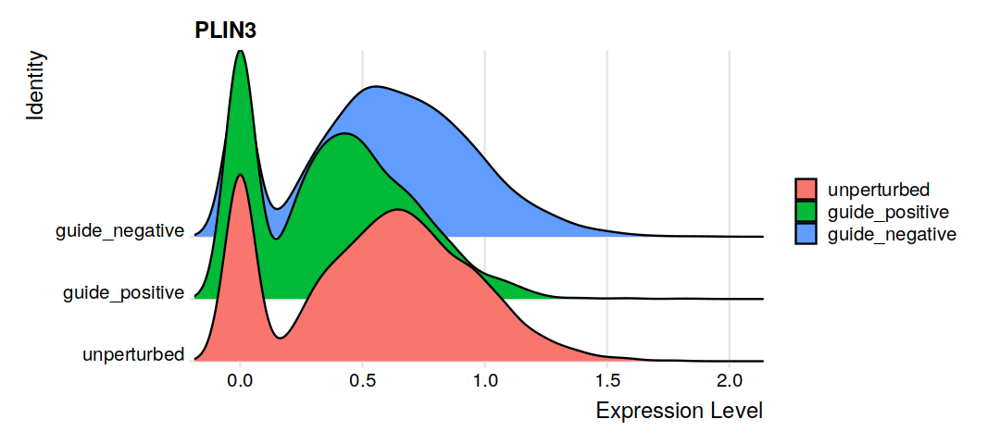


 Completed [============>-------------------------------]  29% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [====================>-----------------------]  49% with 0 failures

 Completed [======================>---------------------]  51% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [===========================

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PLIN3,1.5e-64,-0.28,0.71,0.78,5.6e-60
SQSTM1,6.0e-41,0.45,1.00,0.99,2.2e-36
SNHG16,4.7e-34,0.26,0.92,0.88,1.7e-29
PSAP,1.4e-30,0.32,0.99,0.98,5.0e-26
AL357507.1,2.9e-28,0.43,0.28,0.12,1.1e-23
AL138828.1,7.8e-24,0.43,0.54,0.36,2.9e-19
SLC35F1,8.5e-24,0.30,0.49,0.31,3.1e-19
HMOX1,1.0e-23,0.53,0.77,0.64,3.7e-19
HSP90B1,3.2e-23,-0.27,0.98,0.98,1.2e-18


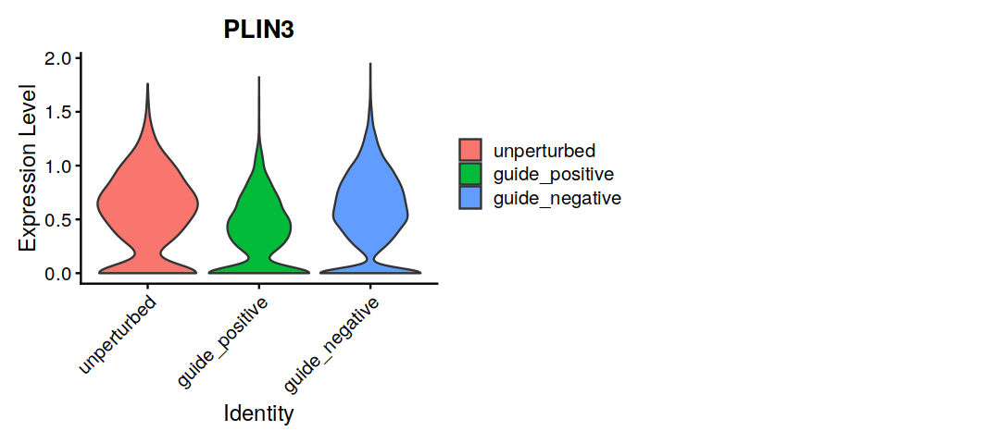

In [ ]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_pert_unpert(seurat_rna, perturbed_cells_by_guide, df_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 


markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'unperturbed',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

In [ ]:
nrow(markers)

[1] 35

Guide+ = 2357 ; Guide- = 19006 


Picking joint bandwidth of 0.0525



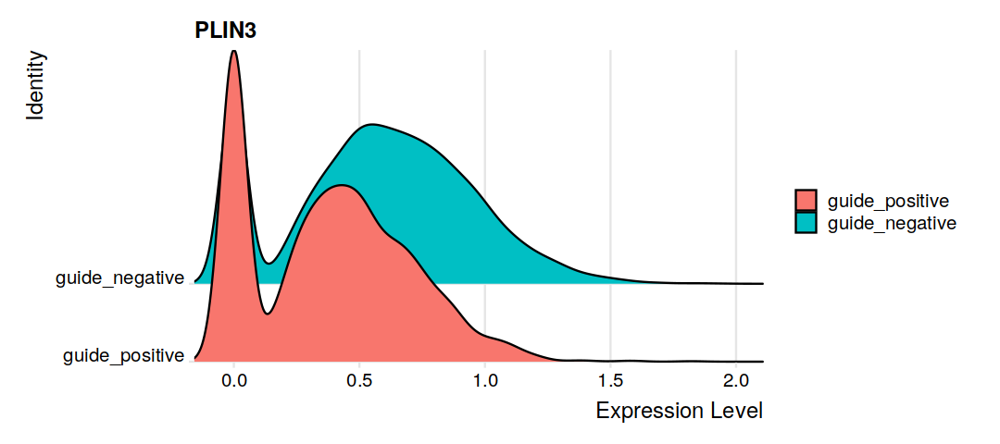


 Completed [================================>-----------]  75% with 0 failures

 Completed [============================================] 100% with 0 failures
                                                                              


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


 Completed [================================>-----------]  75% with 0 failures

 Completed [============================================] 100% with 0 failures
                                                                              


Done!



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PLIN3,2.8e-140,-0.29,0.71,0.82,1.0e-135
HMOX1,2.2e-27,0.35,0.77,0.70,8.1e-23
AL138828.1,7.8e-22,0.27,0.54,0.44,2.8e-17
IFI27,3.7e-13,0.26,0.52,0.44,1.4e-08


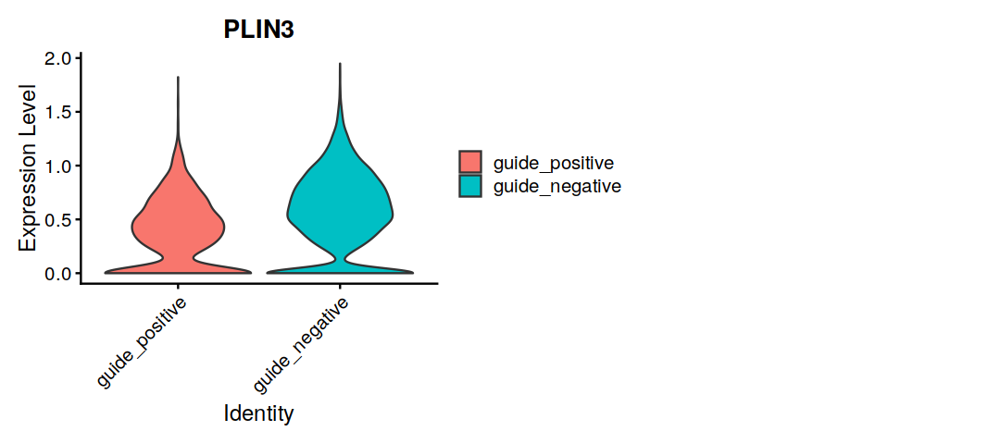

In [ ]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'guide_negative',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

### How many no-guide cells?

In [ ]:
all_cells_w_a_guide = unique(unlist(perturbed_cells_by_guide))
all_cells = unique(Cells(seurat_rna))
no_guide_cells = setdiff(all_cells, all_cells_w_a_guide)

In [ ]:
length(no_guide_cells)

[1] 18

### How many 'non-targeting only' cells?

# * * * DE for all Targeting Guides * * *

In [ ]:
count_idents <- function(seurat_obj, idents) {
    length(Cells(subset(seurat_obj, idents = idents)))
}

In [ ]:
targets = unique(filter(df_guide, class=='targeting')$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
#genes_to_skip = c()
lfc_threshold = 0.05

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "MAST",
        latent.vars = c("library", "donor"),
        logfc.threshold = lfc_threshold,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

ANPEP : CD13-1a,CD13-1b 
Guide+ = 1390 ; Guide- = 19973 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

Skipping CD55 
NT5E : CD73-1a,CD73-1b 
Guide+ = 1202 ; Guide- = 20161 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

FUBP1 : FUBP1-1a,FUBP1-1b 
Guide+ = 1060 ; Guide- = 20303 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

C15orf40 : C15orf40-1a,C15orf40-1b 
Guide+ = 1287 ; Guide- = 20076 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

MAFF : MAFF-1a,MAFF-1b 
Guide+ = 1043 ; Guide- = 20320 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

FTH1 : FTH1-1a,FTH1-2a,FTH1-1b,FTH1-2b 
Guide+ = 3997 ; Guide- = 17366 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

PLIN3 : PLIN3-1a,PLIN3-2a,PLIN3-1b,PLIN3-2b 
Guide+ = 2357 ; Guide- = 19006 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

TKT : TKT-1a,TKT-2a,TKT-1b,TKT-2b 
Guide+ = 2255 ; Guide- = 19108 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

LGALS3 : LGALS3-1a,LGALS3-2a,LGALS3-1b,LGALS3-2b 
Guide+ = 2451 ; Guide- = 18912 



 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

Skipping CSTB 
CTSB : CTSB-1a,CTSB-2a,CTSB-1b,CTSB-2b 
Guide+ = 2582 ; Guide- = 18781 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

KLF6 : KLF6-1a,KLF6-2a,KLF6-1b,KLF6-2b 
Guide+ = 2550 ; Guide- = 18813 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE1 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2565 ; Guide- = 18798 



 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE2 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1420 ; Guide- = 19943 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE3 : DE3-1a,DE3-2a,DE3-1b,DE3-2b 
Guide+ = 2754 ; Guide- = 18609 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE4 : DE4-1a,DE4-2a,DE4-1b,DE4-2b 
Guide+ = 2897 ; Guide- = 18466 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

Skipping DE5 
DE6 : DE6-1a,DE6-2a,DE6-1b,DE6-2b 
Guide+ = 3244 ; Guide- = 18120 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE7 : DE7-1a,DE7-2a,DE7-1b,DE7-2b 
Guide+ = 2648 ; Guide- = 18715 



 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>-----------------------

DE8 : DE8-1a,DE8-2a,DE8-1b,DE8-2b 
Guide+ = 3075 ; Guide- = 18288 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE9 : DE9-1a,DE9-2a,DE9-1b,DE9-2b 
Guide+ = 1542 ; Guide- = 19821 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE10 : DE10-1a,DE10-2a,DE10-1b,DE10-2b 
Guide+ = 2226 ; Guide- = 19137 



 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>-----------------------

DE11 : DE11-1a,DE11-2a,DE11-1b,DE11-2b 
Guide+ = 2554 ; Guide- = 18809 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE12 : DE12-1a,DE12-2a,DE12-1b,DE12-2b 
Guide+ = 2430 ; Guide- = 18933 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE13 : DE13-1a,DE13-2a,DE13-1b,DE13-2b 
Guide+ = 1912 ; Guide- = 19451 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE14 : DE14-1a,DE14-2a,DE14-1b,DE14-2b 
Guide+ = 2554 ; Guide- = 18809 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE15 : DE15-1a,DE15-2a,DE15-1b,DE15-2b 
Guide+ = 2662 ; Guide- = 18701 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE16 : DE16-1a,DE16-2a,DE16-1b,DE16-2b 
Guide+ = 2152 ; Guide- = 19211 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

DE17 : DE17-1a,DE17-2a,DE17-1b,DE17-2b 
Guide+ = 2399 ; Guide- = 18964 



 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

Write to file

In [ ]:
lfc = gsub("\\.", "_", lfc_threshold)
de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_UNFILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

### Filter out spurious hits

In [ ]:
# Some genes come up as differentially expressed all the time
# Filter those out, and write to another file
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
df_de = filter(df_de, !(de_gene  %in% funky_de_genes))

de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_FILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

# Inpect DE results

In [ ]:
df_de = read.table(de_f_name, sep="\t",  header = T)

Print top high-confidence hits

In [ ]:
df_de %>% filter(avg_log2FC < 0) %>% arrange(p_val_adj) %>% head(30)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0.0e+00,-0.572,1.00,1.00,0.0e+00,FTH1,FTH1
2,7.4e-206,-0.720,0.84,0.92,2.7e-201,LGALS3,LGALS3
3,5.3e-203,-0.579,0.46,0.82,1.9e-198,NT5E,NT5E
4,1.3e-179,-0.456,0.95,0.98,4.9e-175,TKT,TKT
5,9.5e-171,-0.326,0.29,0.63,3.5e-166,C15orf40,C15orf40
6,4.0e-159,-0.591,0.96,0.97,1.5e-154,CTSB,CTSB
7,2.9e-140,-0.295,0.71,0.82,1.1e-135,PLIN3,PLIN3
8,7.5e-116,-0.504,0.57,0.80,2.8e-111,ANPEP,ANPEP
9,1.3e-103,-0.309,0.57,0.71,4.7e-99,NDRG1,DE6


In [ ]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(1))
    #cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 7.7e-116       -0.5  0.57   0.8  2.8e-111   ANPEP  ANPEP
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 5.7e-203      -0.58  0.46  0.82  2.1e-198    NT5E   NT5E
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.6e-50      -0.23  0.54  0.69   9.4e-46   FUBP1  FUBP1
     p_val avg_log2FC pct.1 pct.2 p_val_adj  de_gene   target
1 1.1e-170      -0.33  0.29  0.63  3.9e-166 C15orf40 C15orf40
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 5.5e-31      -0.23  0.63  0.72     2e-26   PTPN3   MAFF
  p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1     0      -0.57     1     1         0    FTH1   FTH1
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 3.5e-140      -0.29  0.71  0.82  1.3e-135   PLIN3  PLIN3
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.7e-179      -0.46  0.95  0.98  6.2e-175     TKT    TKT
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1

# Inspect DE between clusters

## Are HMOX1, SQSTM1 etc localized to a cluster? No

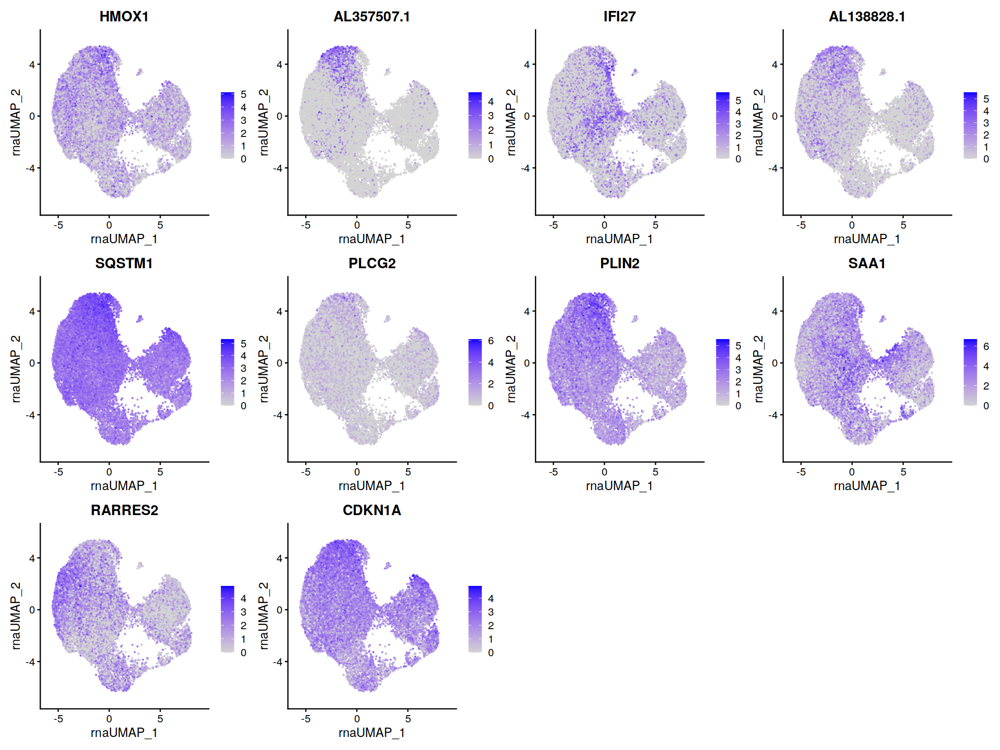

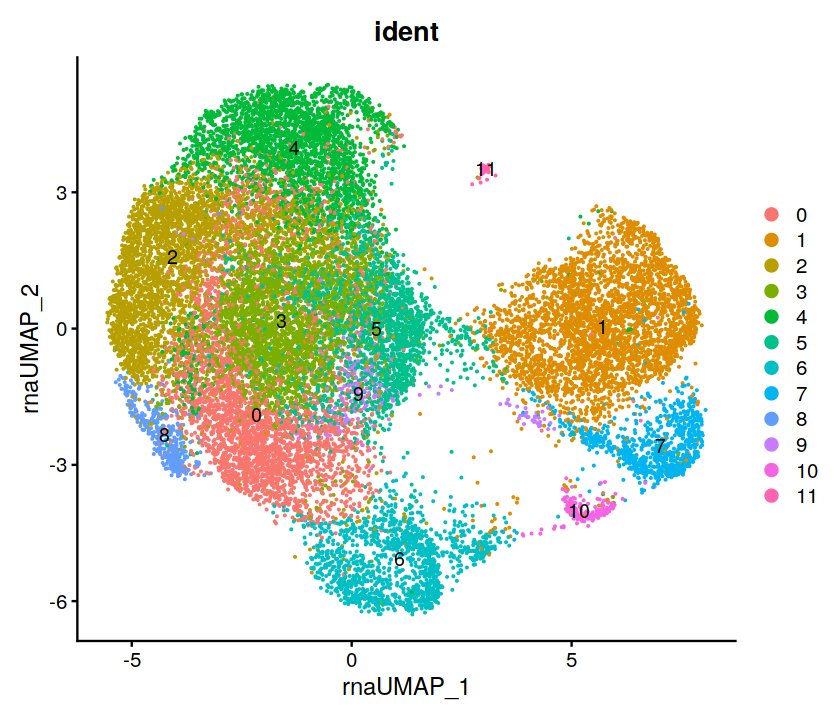

In [ ]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 16, repr.plot.height = 12)
FeaturePlot(seurat_combined, features = funky_de_genes, ncol=4)
options(repr.plot.width=7, repr.plot.height=6)    
DimPlot(seurat_combined, label=T, group.by='ident')

# Compare Cluster 1 to 4

In [ ]:
seurat_dummy = NormalizeData(seurat_combined)

In [ ]:
Idents(seurat_dummy) <- seurat_dummy$seurat_clusters

markers <- FindMarkers(
        object = seurat_dummy,
        assay = 'RNA',
        slot = "data",
        ident.1 = 1,
        ident.2 = 4,
        test.use = "MAST",
        latent.vars = c('library', 'donor'),
        verbose = F
    )


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

# Plot upregulated

In [ ]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-80) & (avg_log2FC > 2))) %>% head(50)
cat(cluster_de_genes, "\n")

AP1S3 ATP1A1 BST2 C5orf38 CD24 CD9 CHST9 CITED4 COBLL1 COL8A1 CRNDE CYS1 DCN DEFB1 DENND2A EML1 EMP1 ERBB4 FAM155A FCGRT FOXC1 FXYD2 GPNMB GSN GSTP1 GYPC HLA-DMB HOXB-AS3 HOXB3 HOXB9 IFITM2 IGFBP2 IRX2 IRX3 ITGB8 KCNIP4 KRT19 LDHB LINC01116 LINC02532 MAL MECOM MMP7 MYOF PANTR1 PDE1A PDLIM4 POU3F3 PRKCQ RP1 


In [ ]:
markers %>% arrange(p_val_adj) %>% filter(avg_log2FC > 5) %>% head(50) %>% rownames()

[1] "AP1S3"     "ATP1A1"    "BST2"      "CD24"      "CD9"       "CHST9"    
 [7] "CITED4"    "COBLL1"    "COL8A1"    "CRNDE"     "CYS1"      "DCN"      
[13] "DEFB1"     "DENND2A"   "EML1"      "EMP1"      "ERBB4"     "FAM155A"  
[19] "FCGRT"     "FOXC1"     "FXYD2"     "GPNMB"     "GSN"       "GSTP1"    
[25] "GYPC"      "HLA-DMB"   "HOXB-AS3"  "HOXB9"     "IFITM2"    "IGFBP2"   
[31] "IRX2"      "IRX3"      "ITGB8"     "KCNIP4"    "KRT19"     "LDHB"     
[37] "LINC01116" "LINC02532" "MAL"       "MECOM"     "MMP7"      "MYOF"     
[43] "PANTR1"    "PDE1A"     "PDLIM4"    "POU3F3"    "PRKCQ"     "RP1"      
[49] "SCIN"      "SEC14L1"

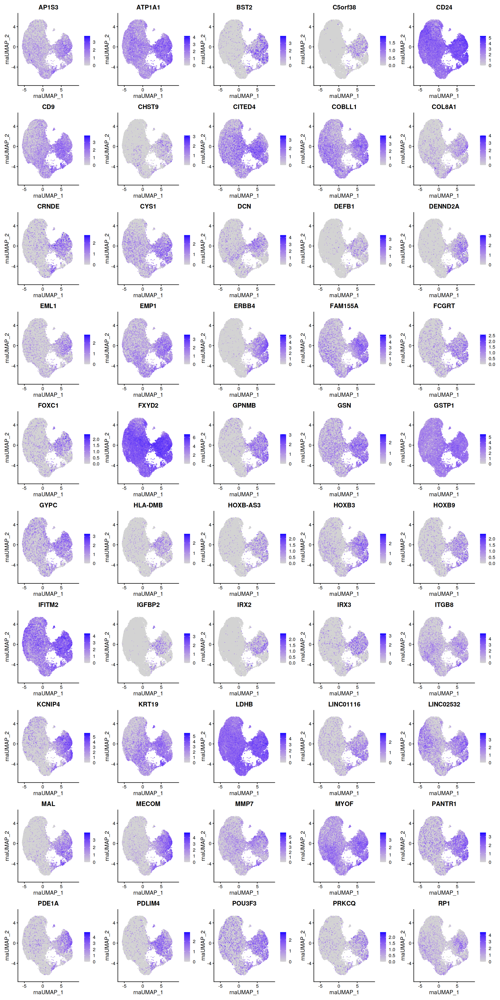

In [ ]:
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

# Plot downregulated

AL138828.1 AL357507.1 IGFBP4 ITPKA L3MBTL4 LGALS3 MGST1 MSC-AS1 NUPR1 OLAH PLIN2 SCHLAP1 SPON1 SPTLC3 TRIB3 DCDC2 DDIT3 DIAPH3 CEBPB ABLIM3 CPNE7 LRMDA RBCK1 SESN2 AFF3 SLC7A7 AP003400.1 SOD2 PTPRD PTK7 ABCA1 SQSTM1 AC138305.1 ZIM3 GMDS DPEP1 CDH2 FNIP2 CDH3 MYLK PNRC1 RNF187 ZEB2 IARS WWC2 CLGN BCAT1 MKNK2 AL591043.2 IL32 


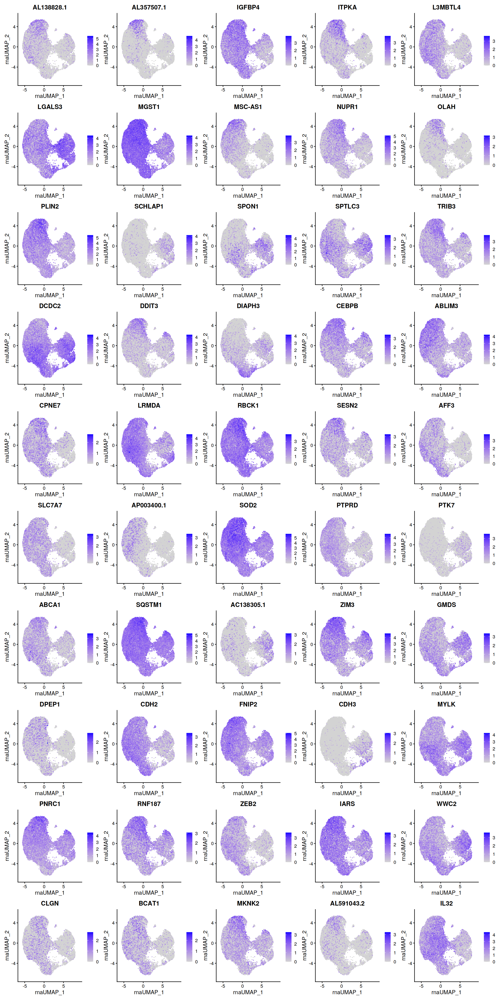

In [ ]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-40) & (avg_log2FC < -4))) %>% head(50)
cat(cluster_de_genes, "\n")
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

## Plot all controls

In [ ]:
all_controls = unique(filter(df_guide, subclass == "tss" | subclass == 'de_control')$alias)

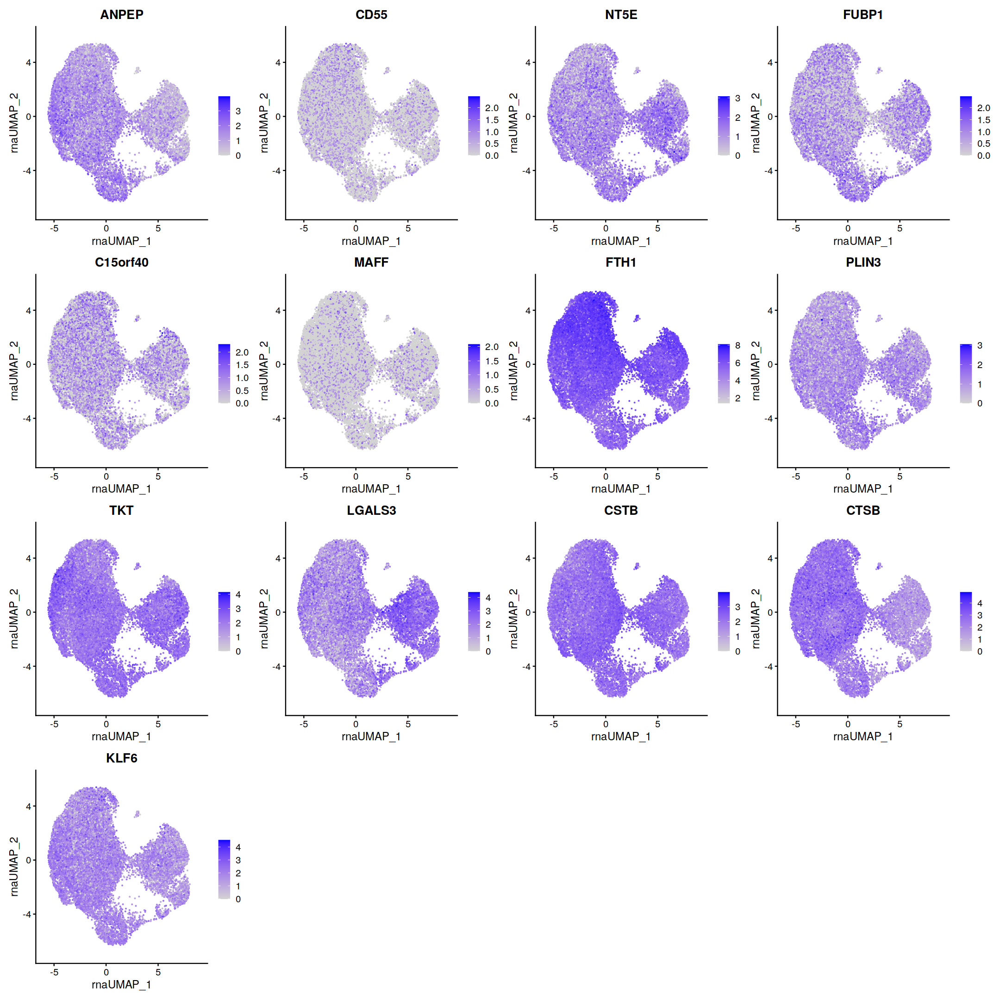

In [ ]:
options(repr.plot.width=18, repr.plot.height=18)
FeaturePlot(seurat_combined, features = all_controls, ncol=4)

# Visualize Knockdowns

## Spurious hits

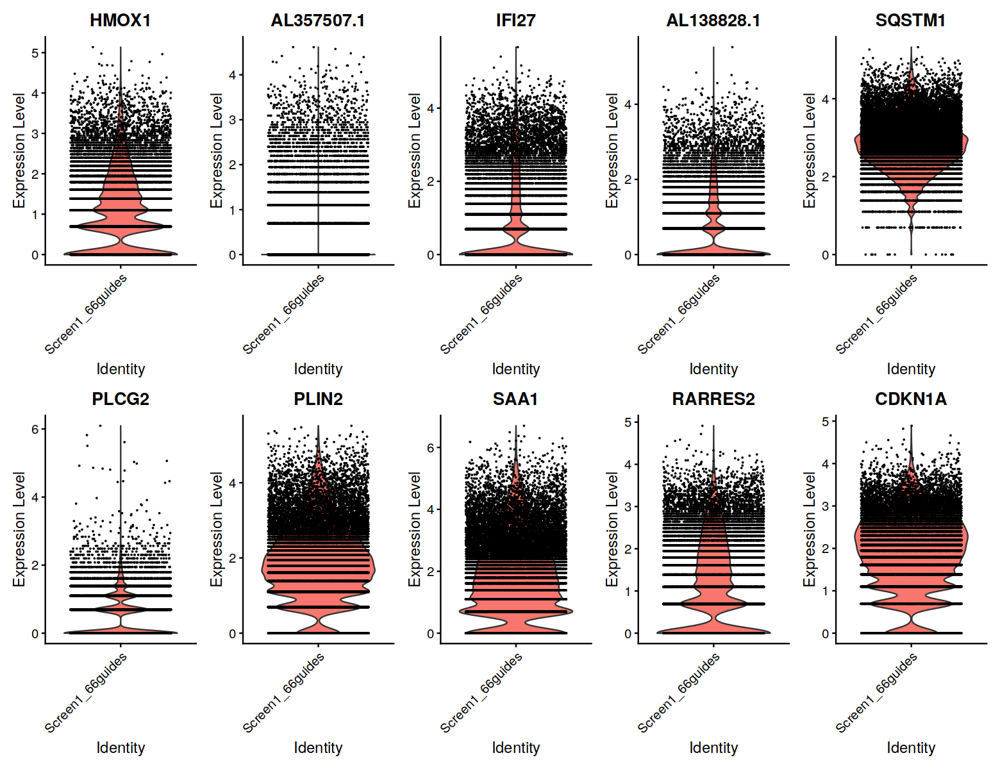

In [ ]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 13, repr.plot.height = 10)
VlnPlot(seurat_combined, features = funky_de_genes, group.by = 'orig.ident', pt.size = 0.001, ncol=5)

## TSS controls

[1] "ANPEP"
Guide+ = 1390 ; Guide- = 19973 
[1] "CD55"
Guide+ = 1298 ; Guide- = 20065 
[1] "NT5E"
Guide+ = 1202 ; Guide- = 20161 
[1] "FUBP1"
Guide+ = 1060 ; Guide- = 20303 
[1] "C15orf40"
Guide+ = 1287 ; Guide- = 20076 
[1] "MAFF"
Guide+ = 1043 ; Guide- = 20320 


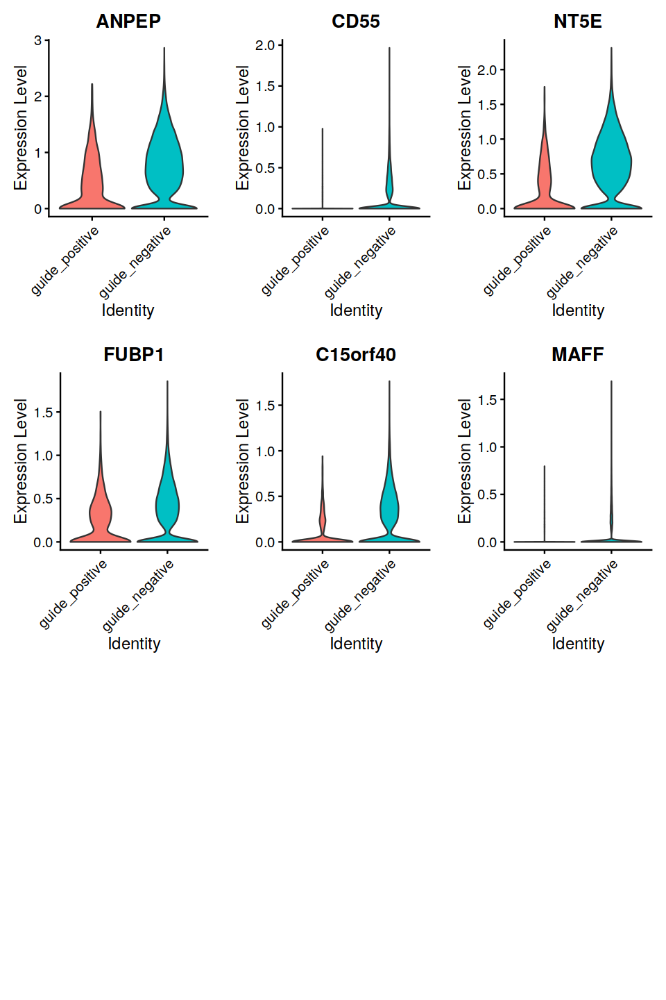

In [ ]:
targets = unique(filter(df_guide, subclass=='tss')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=8, repr.plot.height=12)
ggarrange(plotlist=plots, ncol=3, nrow = 3)

## DE controls

[1] "FTH1"
Guide+ = 3997 ; Guide- = 17366 
[1] "PLIN3"
Guide+ = 2357 ; Guide- = 19006 
[1] "TKT"
Guide+ = 2255 ; Guide- = 19108 
[1] "LGALS3"
Guide+ = 2451 ; Guide- = 18912 
[1] "CSTB"
Guide+ = 2642 ; Guide- = 18721 
[1] "CTSB"
Guide+ = 2582 ; Guide- = 18781 
[1] "KLF6"
Guide+ = 2550 ; Guide- = 18813 


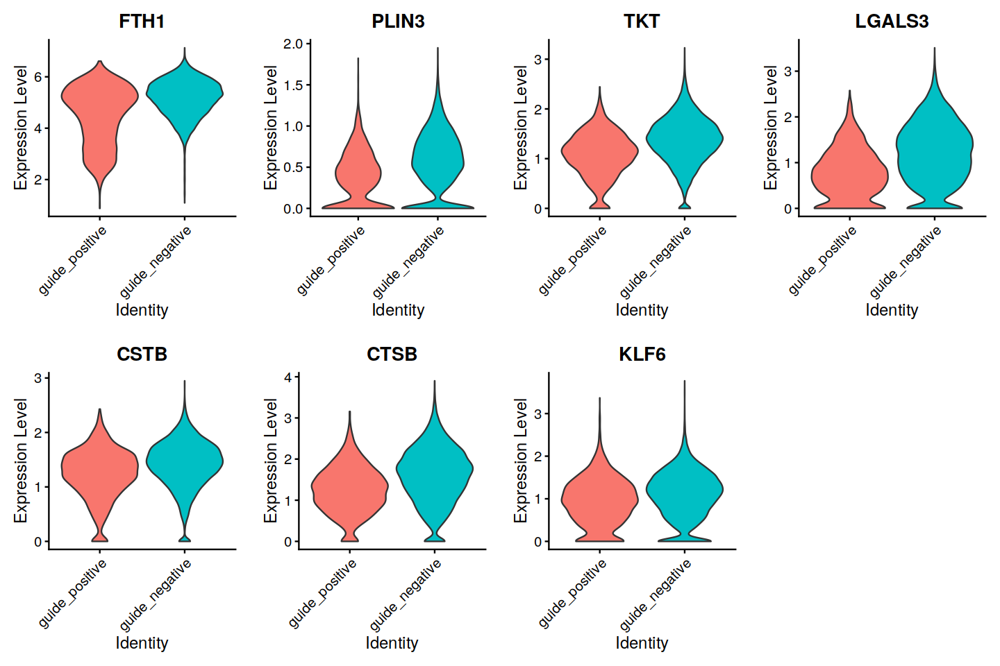

In [ ]:
targets = unique(filter(df_guide, subclass=='de_control')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=12, repr.plot.height=8)
ggarrange(plotlist=plots, ncol=4, nrow = 2)

## CKD DE 

[1] "DE6"
Guide+ = 3244 ; Guide- = 18120 


Picking joint bandwidth of 0.0585

Picking joint bandwidth of 0.0742

Picking joint bandwidth of 0.0949



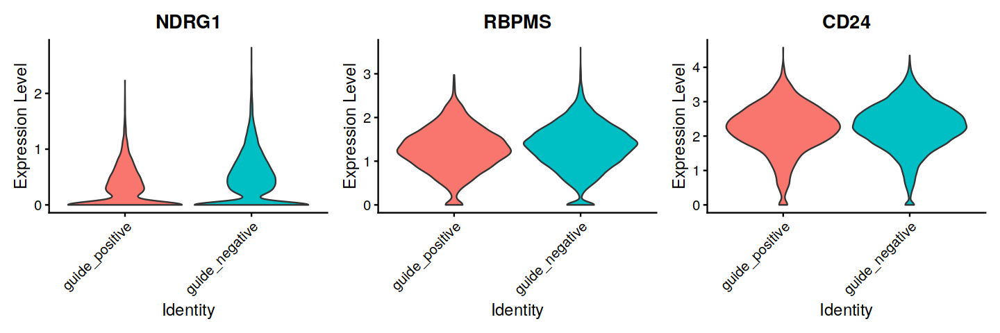

[1] "DE15"
Guide+ = 2662 ; Guide- = 18701 


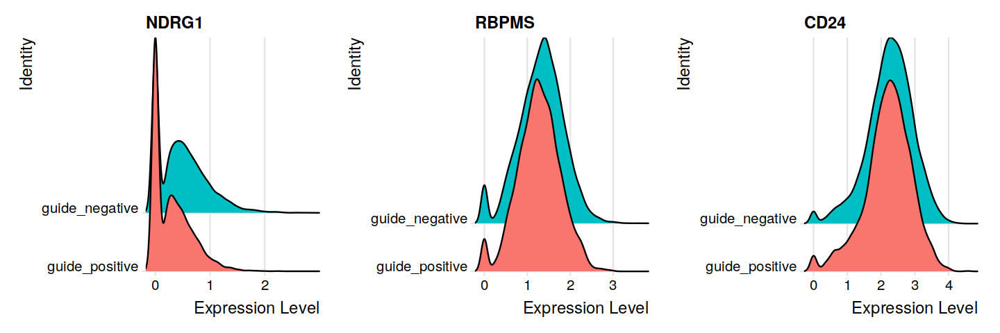

Picking joint bandwidth of 0.0659

Picking joint bandwidth of 0.0752

Picking joint bandwidth of 0.099



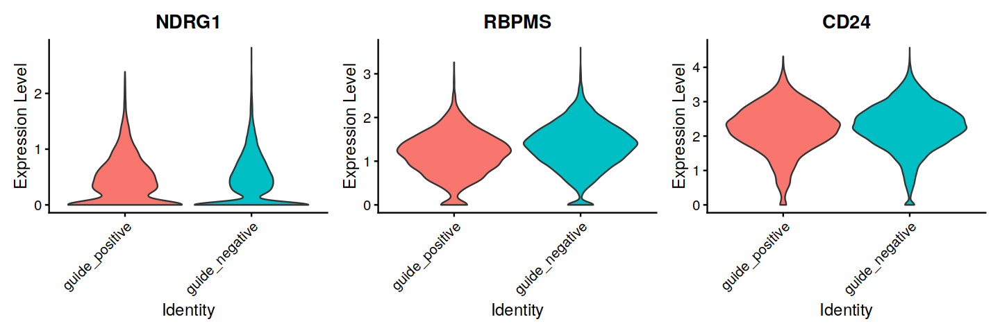

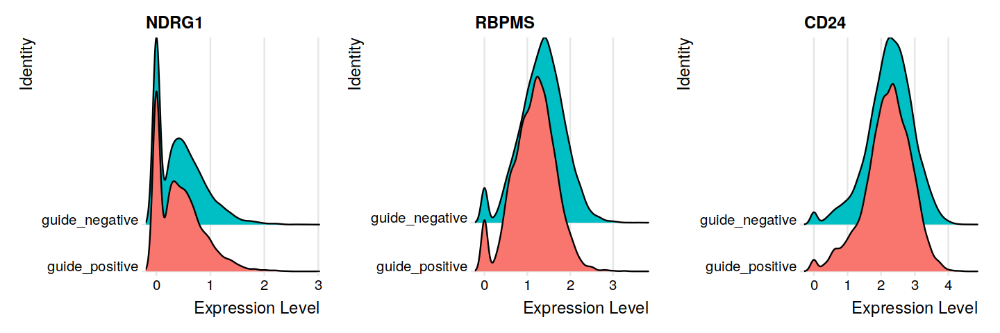

In [ ]:
targets = c("DE6", "DE15")
regulated_genes = c("NDRG1", "RBPMS", "CD24")

for(i in seq_along(targets)) {
    target = targets[i]
    print(target)
    guides = get_guides_by_subclass(df_guide, 'alias', target)
    seurat_rna <- mark_guide_pos_neg(
        seurat_rna, 
        perturbed_cells_by_guide, 
        guides, 
        print_counts = T
    )

    options(repr.plot.width=6, repr.plot.height=4)
    plt <- VlnPlot(
        object = seurat_rna,
        features = regulated_genes, 
        idents = NULL, 
        pt.size = 0, 
        sort = F, 
        ncol = 3,    
    ) 

    options(repr.plot.width=12, repr.plot.height=4)
    plt2 <- RidgePlot(
        object = seurat_rna,
        features = regulated_genes, 
        idents = NULL,  
        sort = F, 
        ncol = 3,    
    ) 

    print(plt) 
    print(plt2)
}



## Donor DE

In [ ]:
donors = unique(seurat_rna$donor)
Idents(seurat_rna) <- seurat_rna$donor
donor_combs = combn(donors, 2)

for(i in 1:ncol(donor_combs)) {
    donor_a = donor_combs[1, i]
    donor_b = donor_combs[2, i]
    cat(blue("Donor", donor_a, "vs", donor_b, "\n"))
    
    markers <- FindMarkers(
        object = seurat_rna,
        slot = "data",
        ident.1 = donor_a,
        ident.2 = donor_b,
        test.use = "MAST",
        latent.vars = c('library'),
        verbose = F
    )
    print(markers)
}

Donor 3 vs 0 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


[1] avg_log2FC pct.1      pct.2     
<0 rows> (or 0-length row.names)
Donor 3 vs 2 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


[1] avg_log2FC pct.1      pct.2     
<0 rows> (or 0-length row.names)
Donor 3 vs 1 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


[1] avg_log2FC pct.1      pct.2     
<0 rows> (or 0-length row.names)
Donor 0 vs 2 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


[1] avg_log2FC pct.1      pct.2     
<0 rows> (or 0-length row.names)
Donor 0 vs 1 



Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



          p_val avg_log2FC pct.1 pct.2 p_val_adj
PLCG2      0.65      -0.28  0.47  0.65         1
MTRNR2L12  0.78      -0.27  0.94  0.97         1
HIST1H4C   0.84      -0.25  0.90  0.95         1
Donor 2 vs 1 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


[1] avg_log2FC pct.1      pct.2     
<0 rows> (or 0-length row.names)


# Check DE for genes near SNPs

In [ ]:
select_distal  = df_guide$subclass == 'ckd_de'
df_snps = unique(df_guide[select_distal, c('gene','alias')])

In [ ]:
snp_coords = ncbi_snp_query(df_snps$gene)

Getting info about the following rsIDs: rs2823139, rs7642977, rs78581838, rs7707989, rs527616, rs10283362, rs34861762, rs16874072, rs881858, rs4669722, rs76839935, rs6839100, rs11154336, rs4720089, rs2979488, rs2661503, rs10224210



In [ ]:
snp_upstream_range   = 100000
snp_downstream_range = 100000

df_snp_coords        = data.frame(chr=paste0("chr", snp_coords$chromosome))
df_snp_coords$start  = snp_coords$bp + snp_upstream_range
df_snp_coords$end    = snp_coords$bp + snp_downstream_range
df_snp_coords$strand = '*'
df_snp_coords$rsid   = snp_coords$rsid
#snp_granges = makeGRangesFromDataFrame(df_dummy)

In [ ]:
ensembl <- useEnsembl(biomart = "genes", dataset = "hsapiens_gene_ensembl")
searchDatasets(mart = ensembl, pattern = "hsapiens")
mart <- useMart("ensembl")
mart <- useDataset("hsapiens_gene_ensembl", mart)

,dataset,description,version
,<I<chr>>,<I<chr>>,<I<chr>>
79,hsapiens_gene_ensembl,Human genes (GRCh38.p13),GRCh38.p13


## Find the neighbors of each SNP

In [ ]:
genes_in_assay = rownames(seurat_rna[['RNA']]@counts)

In [ ]:
attributes <- c("ensembl_gene_id","chromosome_name", "start_position","end_position","strand","hgnc_symbol", "refseq_ncrna", "refseq_ncrna_predicted" )
filters    <- c("chromosome_name","start","end")
snp_upstream_range   = 1000000
snp_downstream_range = 1000000
snp_neigbors_list = list()

for(i in 1:nrow(snp_coords)) {
    snp = snp_coords[i, ]
    cat(blue(snp$rsid,"\t"))
    chr = snp$chromosome
    start = snp$bp - snp_upstream_range
    end   = snp$bp + snp_downstream_range
    
    values <- list(chromosome=chr, start = start, end = end)
    neighbor_genes <- getBM(attributes=attributes, filters=filters, values=values, mart=mart)
    n_neighbors   = length(unique(neighbor_genes$ensembl_gene_id))
    select_non_na = !is.na(neighbor_genes$hgnc_symbol) & (neighbor_genes$hgnc_symbol != "")
    neighbor_genes <- neighbor_genes[select_non_na, ]
    n_neighbors_w_names = length(unique(neighbor_genes$hgnc_symbol))
    cat(blue(n_neighbors, "neigbors found,", n_neighbors_w_names, "have a name, "))

    if(n_neighbors_w_names > 0){        
        dummy = as.vector(unique(neighbor_genes$hgnc_symbol))
        # some neighbors are not in the cellranger reference. Remove those.
        select_genes_in_assay = dummy %in% genes_in_assay
        cat(blue(sum(select_genes_in_assay), " found in assay"))
        print(snp_neigbors_list)
        snp_neigbors_list[[snp$rsid]] = dummy[select_genes_in_assay]
        cat(snp_neigbors_list[[snp$rsid]], "\n")
    }else { print("") }
}

rs2823139 	36 neigbors found, 21 have a name, 9  found in assaylist()
LIPI RBM11 HSPA13 SAMSN1 SAMSN1-AS1 LINC02246 NRIP1 USP25 MIR99AHG 
rs7642977 	54 neigbors found, 36 have a name, 26  found in assay$rs2823139
[1] "LIPI"       "RBM11"      "HSPA13"     "SAMSN1"     "SAMSN1-AS1"
[6] "LINC02246"  "NRIP1"      "USP25"      "MIR99AHG"  

PLAAT1 ATP13A5 ATP13A5-AS1 ATP13A4 ATP13A4-AS1 OPA1 OPA1-AS1 LINC02038 LINC02026 LINC02028 HES1 LINC02036 LINC02037 LINC02048 LINC00887 CPN2 LRRC15 GP5 ATP13A3 TMEM44-AS1 TMEM44 LSG1 FAM43A LINC01968 LINC01972 XXYLT1 
rs78581838 	46 neigbors found, 27 have a name, 8  found in assay$rs2823139
[1] "LIPI"       "RBM11"      "HSPA13"     "SAMSN1"     "SAMSN1-AS1"
[6] "LINC02246"  "NRIP1"      "USP25"      "MIR99AHG"  

$rs7642977
 [1] "PLAAT1"      "ATP13A5"     "ATP13A5-AS1" "ATP13A4"     "ATP13A4-AS1"
 [6] "OPA1"        "OPA1-AS1"    "LINC02038"   "LINC02026"   "LINC02028"  
[11] "HES1"        "LINC02036"   "LINC02037"   "LINC02048"   "LINC00887"  
[16] "

## Run diffex on genes neighboring the snps w/ min_LFC = 0.15 

In [ ]:
df_targets = unique(filter(df_guide, subclass=='ckd_de')[,c('alias','gene')])
df_de = NULL
test_use = "LR" #"MAST" 
guides_to_skip = c()  #c("DE6", "DE15")  

for(i in 1:nrow(df_targets)){
    target = df_targets[i,'alias']
    rsid = df_targets[i,'gene']
    neigbors = snp_neigbors_list[[rsid]]
    
    if((target %in% guides_to_skip) | length(neigbors) == 0 ){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target, rsid,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        features = neigbors,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = test_use,
        latent.vars = c("library", "donor"),
        logfc.threshold = 0.15,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(red("No DE genes MAST", target,  "\n"))
        next
    }
    # markers$de_gene = rownames(markers)
    # markers$target = target
    # rownames(markers) <- NULL
    # df_de = rbind(df_de, markers)
    print(markers)
}

DE1 rs2823139 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2565 ; Guide- = 18798 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE1 
DE2 rs7642977 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1420 ; Guide- = 19943 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE2 
DE3 rs78581838 : DE3-1a,DE3-2a,DE3-1b,DE3-2b 
Guide+ = 2754 ; Guide- = 18609 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE3 
DE4 rs7707989 : DE4-1a,DE4-2a,DE4-1b,DE4-2b 
Guide+ = 2897 ; Guide- = 18466 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE4 
DE5 rs527616 : DE5-1a,DE5-2a,DE5-1b,DE5-2b 
Guide+ = 2841 ; Guide- = 18522 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE5 
DE6 rs10283362 : DE6-1a,DE6-2a,DE6-1b,DE6-2b 
Guide+ = 3244 ; Guide- = 18120 
         p_val avg_log2FC pct.1 pct.2 p_val_adj
NDRG1 6.7e-109      -0.31  0.57  0.71  2.4e-104
DE7 rs34861762 : DE7-1a,DE7-2a,DE7-1b,DE7-2b 
Guide+ = 2648 ; Guide- = 18715 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE7 
DE8 rs16874072 : DE8-1a,DE8-2a,DE8-1b,DE8-2b 
Guide+ = 3075 ; Guide- = 18288 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE8 
DE9 rs881858 : DE9-1a,DE9-2a,DE9-1b,DE9-2b 
Guide+ = 1542 ; Guide- = 19821 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE9 
DE10 rs4669722 : DE10-1a,DE10-2a,DE10-1b,DE10-2b 
Guide+ = 2226 ; Guide- = 19137 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE10 
DE11 rs76839935 : DE11-1a,DE11-2a,DE11-1b,DE11-2b 
Guide+ = 2554 ; Guide- = 18809 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE11 
DE12 rs6839100 : DE12-1a,DE12-2a,DE12-1b,DE12-2b 
Guide+ = 2430 ; Guide- = 18933 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE12 
DE13 rs11154336 : DE13-1a,DE13-2a,DE13-1b,DE13-2b 
Guide+ = 1912 ; Guide- = 19451 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE13 
DE14 rs4720089 : DE14-1a,DE14-2a,DE14-1b,DE14-2b 
Guide+ = 2554 ; Guide- = 18809 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE14 
DE15 rs2979488 : DE15-1a,DE15-2a,DE15-1b,DE15-2b 
Guide+ = 2662 ; Guide- = 18701 
        p_val avg_log2FC pct.1 pct.2 p_val_adj
RBPMS 3.2e-64      -0.28  0.96  0.97   1.2e-59
DE16 rs2661503 : DE16-1a,DE16-2a,DE16-1b,DE16-2b 
Guide+ = 2152 ; Guide- = 19211 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE16 
DE17 rs10224210 : DE17-1a,DE17-2a,DE17-1b,DE17-2b 
Guide+ = 2399 ; Guide- = 18964 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


No DE genes MAST DE17 


In [ ]:
snp_neigbors_list

$rs2823139
[1] "LIPI"       "RBM11"      "HSPA13"     "SAMSN1"     "SAMSN1-AS1"
[6] "LINC02246"  "NRIP1"      "USP25"      "MIR99AHG"  

$rs7642977
 [1] "PLAAT1"      "ATP13A5"     "ATP13A5-AS1" "ATP13A4"     "ATP13A4-AS1"
 [6] "OPA1"        "OPA1-AS1"    "LINC02038"   "LINC02026"   "LINC02028"  
[11] "HES1"        "LINC02036"   "LINC02037"   "LINC02048"   "LINC00887"  
[16] "CPN2"        "LRRC15"      "GP5"         "ATP13A3"     "TMEM44-AS1" 
[21] "TMEM44"      "LSG1"        "FAM43A"      "LINC01968"   "LINC01972"  
[26] "XXYLT1"     

$rs78581838
[1] "LIPI"       "RBM11"      "HSPA13"     "SAMSN1"     "SAMSN1-AS1"
[6] "LINC02246"  "NRIP1"      "USP25"     

$rs7707989
 [1] "LINC02242" "LINC02219" "PIK3R1"    "LINC02198" "SLC30A5"   "CCNB1"    
 [7] "CENPH"     "MRPS36"    "CDK7"      "CCDC125"   "AK6"       "TAF9"     
[13] "RAD17"    

$rs527616
 [1] "SS18"      "PSMA8"     "TAF4B"     "LINC01543" "KCTD1"     "AQP4-AS1" 
 [7] "PCAT18"    "AQP4"      "CHST9"     "LINC01908"

$rs10283362
[1] "KCNQ3"   "SLA"     "TG"      "HPYR1"   "ST3GAL1" "CCN4"    "NDRG1"  
[8] "PHF20L1" "TMEM71" 

$rs34861762
 [1] "PEBP4"         "RHOBTB2"       "TNFRSF10B"     "TNFRSF10C"    
 [5] "TNFRSF10D"     "TNFRSF10A-AS1" "TNFRSF10A"     "CHMP7"        
 [9] "R3HCC1"        "LOXL2"         "ENTPD4"        "SLC25A37"     
[13] "NKX3-1"        "NKX2-6"        "STC1"          "ADAM28"       
[17] "ADAMDEC1"      "ADAM7"        

$rs16874072
[1] "ERVH-1"    "PPARGC1A"  "DHX15"     "LINC02473"

$rs881858
 [1] "BICRAL"    "RPL7L1"    "C6orf226"  "PTCRA"     "CNPY3"     "GNMT"     
 [7] "PEX6"      "PPP2R5D"   "MEA1"      "KLHDC3"    "RRP36"     "CUL7"     
[13] "KLC4"      "MRPL2"     "PTK7"      "SRF"       "CUL9"      "DNPH1"    
[19] "TTBK1"     "SLC22A7"   "CRIP3"     "ZNF318"    "ABCC10"    "DLK2"     
[25] "TJAP1"     "LRRC73"    "POLR1C"    "YIPF3"     "XPO5"      "POLH"     
[31] "POLH-AS1"  "GTPBP2"    "MAD2L1BP"  "RSPH9"     "MRPS18A"   "VEGFA"    
[37] "LINC02537" "MRPL14"    "TMEM63B"   "CAPN11"    "MYMX"      "SLC29A1"  
[43] "HSP90AB1"  "SLC35B2"   "NFKBIE"    "TMEM151B"  "TCTE1"     "AARS2"    
[49] "SPATS1"    "CDC5L"     "SUPT3H"   

$rs4669722
 [1] "HPCAL1"    "ODC1"      "ODC1-DT"   "NOL10"     "RN7SL832P" "ATP6V1C2" 
 [7] "PDIA6"     "LINC01954" "KCNF1"     "C2orf50"   "SLC66A3"   "ROCK2"    
[13] "LINC00570" "E2F6"      "GREB1"     "NTSR2"     "LPIN1"     "MIR3681HG"

$rs76839935
 [1] "RHEB"       "PRKAG2"     "ACTR3B"     "GALNTL5"    "CRYGN"     
 [6] "WDR86"      "NOS3"       "ASIC3"      "CDK5"       "TMUB1"     
[11] "AGAP3"      "ASB10"      "IQCA1L"     "ABCF2"      "GALNT11"   
[16] "LINC01003"  "SMARCD3"    "SLC4A2"     "ABCB8"      "NUB1"      
[21] "KMT2C"      "KCNH2"      "FASTK"      "ATG9B"      "GBX1"      
[26] "CHPF2"      "XRCC2"      "WDR86-AS1"  "PRKAG2-AS1"

$rs6839100
 [1] "RCHY1"    "THAP6"    "ODAPH"    "CDKL2"    "G3BP2"    "USO1"    
 [7] "PPEF2"    "NAAA"     "SDAD1"    "CXCL9"    "ART3"     "CXCL10"  
[13] "CXCL11"   "NUP54"    "SCARB2"   "FAM47E"   "STBD1"    "CCDC158" 
[19] "SHROOM3"  "SOWAHB"   "SEPTIN11" "CCNI"     "CCNG2"   

$rs11154336
 [1] "RNF217-AS1" "RNF217"     "TPD52L1"    "HDDC2"      "LINC02523" 
 [6] "HEY2"       "NCOA7"      "NCOA7-AS1"  "HINT3"      "TRMT11"    
[11] "CENPW"     

$rs4720089
 [1] "PDE1C"     "LSM5"      "AVL9"      "LINC00997" "KBTBD2"    "FKBP9"    
 [7] "NT5C3A"    "RP9"       "BBS9"      "BMPER"    

$rs2979488
 [1] "LINC00589" "LINC02099" "LINC02209" "SARAF"     "LEPROTL1"  "MBOAT4"   
 [7] "DCTN6"     "RBPMS-AS1" "RBPMS"     "GTF2E2"    "SMIM18"    "GSR"      
[13] "UBXN8"     "PPP2CB"    "TEX15"     "PURG"      "WRN"      

$rs2661503
 [1] "TFAP2D"    "TFAP2B"    "PKHD1"     "LINCMD1"   "IL17A"     "IL17F"    
 [7] "MCM3"      "PAQR8"     "EFHC1"     "TRAM2"     "TRAM2-AS1"

$rs10224210
 [1] "RHEB"       "PRKAG2"     "GALNTL5"    "CRYGN"      "WDR86"     
 [6] "NOS3"       "ASIC3"      "CDK5"       "TMUB1"      "AGAP3"     
[11] "ASB10"      "IQCA1L"     "ABCF2"  

# Run Diffex using LR instead of MAST

In [ ]:
targets = unique(filter(df_guide, class=='targeting')$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
genes_to_skip = c()

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "LR",
        latent.vars = c("library", "donor"),
        logfc.threshold = 0.25,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

ANPEP : CD13-1a,CD13-1b 
Guide+ = 1390 ; Guide- = 19973 
CD55 : CD55-1a,CD55-1b 
Guide+ = 1298 ; Guide- = 20065 
NT5E : CD73-1a,CD73-1b 
Guide+ = 1202 ; Guide- = 20161 
FUBP1 : FUBP1-1a,FUBP1-1b 
Guide+ = 1060 ; Guide- = 20303 
C15orf40 : C15orf40-1a,C15orf40-1b 
Guide+ = 1287 ; Guide- = 20076 
MAFF : MAFF-1a,MAFF-1b 
Guide+ = 1043 ; Guide- = 20320 
FTH1 : FTH1-1a,FTH1-2a,FTH1-1b,FTH1-2b 
Guide+ = 3997 ; Guide- = 17366 
PLIN3 : PLIN3-1a,PLIN3-2a,PLIN3-1b,PLIN3-2b 
Guide+ = 2357 ; Guide- = 19006 
TKT : TKT-1a,TKT-2a,TKT-1b,TKT-2b 
Guide+ = 2255 ; Guide- = 19108 
LGALS3 : LGALS3-1a,LGALS3-2a,LGALS3-1b,LGALS3-2b 
Guide+ = 2451 ; Guide- = 18912 
CSTB : CSTB-1a,CSTB-2a,CSTB-1b,CSTB-2b 
Guide+ = 2642 ; Guide- = 18721 
CTSB : CTSB-1a,CTSB-2a,CTSB-1b,CTSB-2b 
Guide+ = 2582 ; Guide- = 18781 
KLF6 : KLF6-1a,KLF6-2a,KLF6-1b,KLF6-2b 
Guide+ = 2550 ; Guide- = 18813 
DE1 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2565 ; Guide- = 18798 
DE2 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1420 ; Guide- = 19943 


In [ ]:
df_de

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1.3e-118,-0.50,0.57,0.80,4.9e-114,ANPEP,ANPEP
6.9e-35,0.33,1.00,0.99,2.5e-30,SQSTM1,ANPEP
5.3e-25,0.40,0.79,0.70,1.9e-20,HMOX1,ANPEP
4.1e-18,0.37,0.32,0.20,1.5e-13,AL357507.1,ANPEP
5.1e-18,0.25,0.95,0.90,1.9e-13,MDM2,ANPEP
6.4e-14,0.28,0.56,0.45,2.3e-09,AL138828.1,ANPEP
9.6e-13,0.29,0.94,0.92,3.5e-08,PLIN2,ANPEP
9.3e-11,0.42,0.53,0.45,3.4e-06,IFI27,ANPEP
2.3e-09,-0.28,0.74,0.76,8.3e-05,KRT19,ANPEP


In [ ]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(3))
    cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.3e-118      -0.50  0.57  0.80  4.9e-114   ANPEP  ANPEP
2  6.9e-35       0.33  1.00  0.99   2.5e-30  SQSTM1  ANPEP
3  5.3e-25       0.40  0.79  0.70   1.9e-20   HMOX1  ANPEP
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 7.4e-20       0.39  0.78   0.7   2.7e-15   HMOX1   CD55
------------------------------------------------------------


     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 8.2e-207      -0.58  0.46  0.82  3.0e-202    NT5E   NT5E
2  4.1e-21       0.48  0.77  0.70   1.5e-16   HMOX1   NT5E
3  5.0e-17       0.27  1.00  0.99   1.8e-12  SQSTM1   NT5E
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.7e-35      -0.44  1.00  1.00   9.8e-31   NEAT1  FUBP1
2 6.3e-26       0.43  0.81  0.70   2.3e-21   HMOX1  FUBP1
3 3.9e-17       0.52  0.56  0.45   1.4e-12   IFI2

# Does the control set have always higher expression regardless the gene?

[1] "DE6"
Guide+ = 3244 ; Guide- = 18120 
[1] "DE15"
Guide+ = 2662 ; Guide- = 18701 


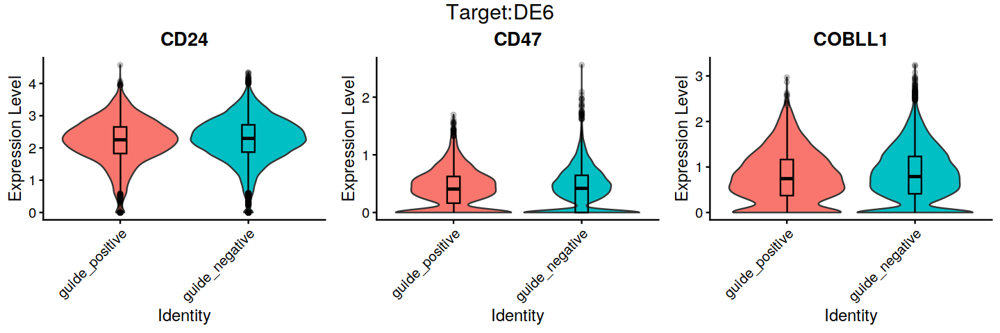

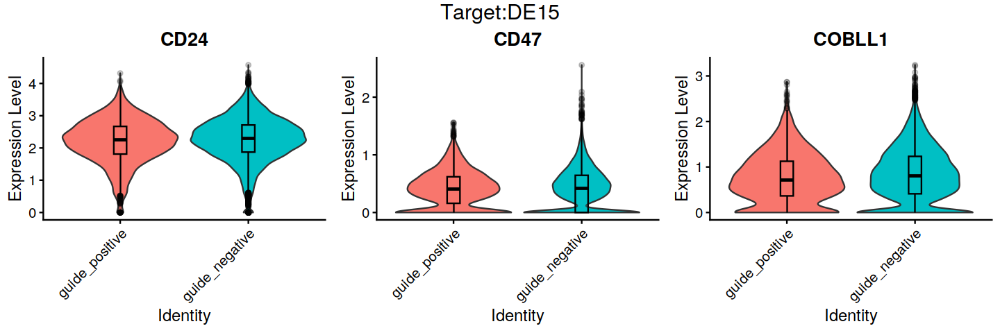

In [ ]:
targets = c("DE6", "DE15")
regulated_genes = c("CD24", "CD47", "COBLL1")


for(i in seq_along(targets)) {
    target = targets[i]
    print(target)
    guides = get_guides_by_subclass(df_guide, 'alias', target)
    seurat_rna <- mark_guide_pos_neg(
        seurat_rna, 
        perturbed_cells_by_guide, 
        guides, 
        print_counts = T
    )

    plots <- VlnPlot(
                    object = seurat_rna,
                    features = regulated_genes, 
                    idents = NULL, 
                    pt.size = 0, 
                    sort = F, 
                    ncol = 3,  
                    combine = F  
        ) 

    for(i in 1:length(plots)) {
        plots[[i]] <- plots[[i]] + 
        NoLegend() +
        geom_boxplot(width=0.1, color="black", alpha=0.2)
    }

    title = paste0("Target:", target)
    plt1 <- ggarrange(plotlist=plots, ncol=3, nrow = 1) 
    plt1 <- annotate_figure(plt1, top = text_grob(title, color = "black", size = 18))  

    print(plt1) 
}

